## Загрузка датасета

In [1]:
!pip install imbalanced-learn

In [24]:
import imblearn
from imblearn.over_sampling import SMOTE
import plotly.graph_objects as go
import sklearn

In [9]:
!pip install imbalanced-learn plotly scikit-learn

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.2.0 requires joblib~=1.1.0, but you have joblib 1.5.2 which is incompatible.
ydata-profiling 0.0.dev0 requires visions[type_image_path]<0.8.2,>=0.7.5, but you have visions 0.7.4 which is incompatible.



   ---------------------------------------- 0.0/8.9 MB ? eta -:--:--
   ---- ----------------------------------- 1.0/8.9 MB 5.6 MB/s eta 0:00:02
   ---------- ----------------------------- 2.4/8.9 MB 5.4 MB/s eta 0:00:02
   --------------- ------------------------ 3.4/8.9 MB 5.4 MB/s eta 0:00:02
   --------------------- ------------------ 4.7/8.9 MB 5.4 MB/s eta 0:00:01
   --------------------------- ------------ 6.0/8.9 MB 5.4 MB/s eta 0:00:01
   ------------------------------- -------- 7.1/8.9 MB 5.4 MB/s eta 0:00:01
   ------------------------------------- -- 8.4/8.9 MB 5.4 MB/s eta 0:00:01
   ---------------------------------------- 8.9/8.9 MB 5.3 MB/s  0:00:01
   ---------------------------------------- 0.0/9.8 MB ? eta -:--:--
   ---- ----------------------------------- 1.0/9.8 MB 5.6 MB/s eta 0:00:02
   -------- ------------------------------- 2.1/9.8 MB 5.3 MB/s eta 0:00:02
   ------------- -------------------------- 3.4/9.8 MB 5.3 MB/s eta 0:00:02
   ------------------ ------

In [5]:
import collections
from collections import Counter




import matplotlib.pyplot as plt

import numpy as np
from numpy import where

import pandas as pd


import seaborn as sns


from sklearn import tree
from sklearn import preprocessing
from sklearn.datasets import make_classification
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.impute import SimpleImputer
from sklearn.metrics import f1_score, confusion_matrix, mean_squared_error, mean_absolute_error, classification_report, roc_auc_score, roc_curve, precision_score, recall_score
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler

Библиотеки быстро эволюционируют, потому после импорта указывается рабочая версия, с которой работал автор на момент написания статьи. Для быстрого дебаггинга используйте команду для установки явной версии '!pip install [библиотека]==[версия]'.

In [6]:
df = pd.read_csv('https://www.dropbox.com/s/62xm9ymoaunnfg6/bank-full.csv?dl=1', sep=';')
df.head()

,Возраст,Работа,Семейный статус,Образование,Кредитный дефолт,Ипотека,Займ,Контакт,Месяц,День недели,...,Кампания,День,Предыдущий контакт,Доходность,Колебание уровня безработицы,Индекс потребительских цен,Индекс потребительской уверенности,Европейская межбанковская ставка,Количество сотрудников в компании,y
0,27,Самозанятый,Не женат / не замужем,Университетская степень,Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,999,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Нет
1,30,Преддприниматель,Женат / замужем,Университетская степень,Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,999,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
2,39,Голубой воротничок,Женат / замужем,Базовое (9 классов),Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,999,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
3,42,Менеджер,Женат / замужем,Высшая школа,Нет,Да,Да,Городской телефон,Октябрь,Пятница,...,1,999,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
4,42,Самозанятый,Женат / замужем,Базовое (4 класса),Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,999,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да


# Разведочный анализ данных

## Удаление дубликатов

In [13]:
df.shape

(41188, 21)

In [14]:
df = df.drop_duplicates()
df.shape

(41176, 21)

## Заполнение пропусков

In [15]:
categorical_values = df[['Работа', 'Семейный статус', 'Образование', 'Контакт', 'Месяц', 'День недели', 'Доходность']].values.ravel()
unique_values = pd.unique(categorical_values)

print(unique_values)

['Самозанятый' 'Не женат / не замужем' 'Университетская степень'
 'Городской телефон' 'Октябрь' 'Пятница' 'Отсутствует' 'Преддприниматель'
 'Женат / замужем' 'Голубой воротничок' 'Базовое (9 классов)' 'Менеджер'
 'Высшая школа' 'Базовое (4 класса)' 'Техник' 'Профессиональный курс'
 'Разведен(-а)' 'Неизвестно' 'Сотовый телефон' 'Август' 'Понедельник'
 'Студент' 'Домохозяйка' 'Обслуживающий персонал' 'Базовое (6 классов)'
 'Пенсионер' 'Четверг' 'Вторник' 'Не присутствует' 'Июль' 'Среда' 'Июнь'
 'Неграмотный' 'Май' 'Ноябрь' 'Присутствует' 'Cамозанятый' 'Декабрь'
 'Март' 'Апрель' 'Сентябрь']


In [7]:
df = df.replace({"День": 999,
                 "Работа": "Неизвестно",
                 "Семейный статус": "Неизвестно",
                 "Образование": "Неизвестно",
                 "Месяц": "Неизвестно",
                 "День недели": "Неизвестно",
                 "Доходность": "Неизвестно",
                 }, np.nan)

df.head(20)

,Возраст,Работа,Семейный статус,Образование,Кредитный дефолт,Ипотека,Займ,Контакт,Месяц,День недели,...,Кампания,День,Предыдущий контакт,Доходность,Колебание уровня безработицы,Индекс потребительских цен,Индекс потребительской уверенности,Европейская межбанковская ставка,Количество сотрудников в компании,y
0,27,Самозанятый,Не женат / не замужем,Университетская степень,Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,NaN,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Нет
1,30,Преддприниматель,Женат / замужем,Университетская степень,Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,NaN,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
2,39,Голубой воротничок,Женат / замужем,Базовое (9 классов),Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,NaN,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
3,42,Менеджер,Женат / замужем,Высшая школа,Нет,Да,Да,Городской телефон,Октябрь,Пятница,...,1,NaN,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
4,42,Самозанятый,Женат / замужем,Базовое (4 класса),Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,NaN,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
5,43,Техник,Не женат / не замужем,Профессиональный курс,Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,NaN,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Нет
6,44,Менеджер,Женат / замужем,Высшая школа,Нет,Да,Нет,Городской телефон,Октябрь,Пятница,...,1,NaN,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Нет
7,46,Менеджер,Разведен(-а),Высшая школа,Нет,Да,Нет,Городской телефон,Октябрь,Пятница,...,1,NaN,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Нет
8,56,NaN,Женат / замужем,NaN,Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,NaN,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
9,29,Техник,Не женат / не замужем,Профессиональный курс,Нет,Нет,Нет,Сотовый телефон,Август,Понедельник,...,2,NaN,0,Отсутствует,1.4,93.444,-36.1,4.970,5228.1,Нет


In [17]:
df.isnull().mean() * 100

Возраст                                0.000000
Работа                                 0.801438
Семейный статус                        0.194288
Образование                            4.201477
Кредитный дефолт                       0.000000
Ипотека                                0.000000
Займ                                   0.000000
Контакт                                0.000000
Месяц                                  0.000000
День недели                            0.000000
Длительность                           0.000000
Кампания                               0.000000
День                                  96.320672
Предыдущий контакт                     0.000000
Доходность                             0.000000
Колебание уровня безработицы           0.000000
Индекс потребительских цен             0.000000
Индекс потребительской уверенности     0.000000
Европейская межбанковская ставка       0.000000
Количество сотрудников в компании      0.000000
y                                      0

In [18]:
df = df.drop(columns=['День'])
df.head()

,Возраст,Работа,Семейный статус,Образование,Кредитный дефолт,Ипотека,Займ,Контакт,Месяц,День недели,Длительность,Кампания,Предыдущий контакт,Доходность,Колебание уровня безработицы,Индекс потребительских цен,Индекс потребительской уверенности,Европейская межбанковская ставка,Количество сотрудников в компании,y
0,27,Самозанятый,Не женат / не замужем,Университетская степень,Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,24,1,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Нет
1,30,Преддприниматель,Женат / замужем,Университетская степень,Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,223,1,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
2,39,Голубой воротничок,Женат / замужем,Базовое (9 классов),Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,270,1,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
3,42,Менеджер,Женат / замужем,Высшая школа,Нет,Да,Да,Городской телефон,Октябрь,Пятница,103,1,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
4,42,Самозанятый,Женат / замужем,Базовое (4 класса),Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,478,1,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да


In [19]:
imputer = SimpleImputer(missing_values = np.nan, strategy = 'most_frequent')
categorical_columns = ["Работа", "Семейный статус", "Образование", "Месяц", "День недели", "Доходность"]
df[categorical_columns] = imputer.fit_transform(df[categorical_columns].values)

In [20]:
imputer = SimpleImputer(missing_values = np.nan, strategy = 'most_frequent')
boolean_columns = ["Кредитный дефолт", "Ипотека", "Займ"]
df[boolean_columns] = imputer.fit_transform(df[boolean_columns].values)

In [21]:
imputer = SimpleImputer(missing_values = np.nan, strategy = 'mean')
numeric_columns = ["Возраст", "Длительность", "Кампания", 'Предыдущий контакт', "Колебание уровня безработицы", "Индекс потребительских цен", "Индекс потребительской уверенности", "Европейская межбанковская ставка", "Количество сотрудников в компании"]
df[numeric_columns] = imputer.fit_transform(df[numeric_columns].values)

## Обнаружение аномалий

<Axes: >

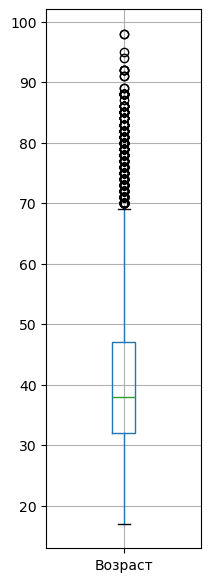

In [22]:
df.boxplot(column=['Возраст'], figsize = (2, 7))

In [23]:
q = df["Возраст"].quantile(0.99)
q2 = df["Длительность"].quantile(0.99)
q3 = df["Кампания"].quantile(0.99)
q5 = df["Предыдущий контакт"].quantile(0.99)
q6 = df["Колебание уровня безработицы"].quantile(0.99)
q7 = df["Индекс потребительских цен"].quantile(0.99)
q8 = df["Индекс потребительской уверенности"].quantile(0.99)
q9 = df["Европейская межбанковская ставка"].quantile(0.99)
q10 = df["Количество сотрудников в компании"].quantile(0.99)

df[df["Возраст"] < q]
df[df["Длительность"] < q2]
df[df["Кампания"] < q3]
df[df["Предыдущий контакт"] < q5]
df[df["Колебание уровня безработицы"] < q6]
df[df["Индекс потребительских цен"] < q7]
df[df["Индекс потребительской уверенности"] < q8]
df[df["Европейская межбанковская ставка"] < q9]
df[df["Количество сотрудников в компании"] < q10]

,Возраст,Работа,Семейный статус,Образование,Кредитный дефолт,Ипотека,Займ,Контакт,Месяц,День недели,Длительность,Кампания,Предыдущий контакт,Доходность,Колебание уровня безработицы,Индекс потребительских цен,Индекс потребительской уверенности,Европейская межбанковская ставка,Количество сотрудников в компании,y
0,27.0,Самозанятый,Не женат / не замужем,Университетская степень,Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,24.0,1.0,0.0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Нет
1,30.0,Преддприниматель,Женат / замужем,Университетская степень,Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,223.0,1.0,0.0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
2,39.0,Голубой воротничок,Женат / замужем,Базовое (9 классов),Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,270.0,1.0,0.0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
3,42.0,Менеджер,Женат / замужем,Высшая школа,Нет,Да,Да,Городской телефон,Октябрь,Пятница,103.0,1.0,0.0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
4,42.0,Самозанятый,Женат / замужем,Базовое (4 класса),Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,478.0,1.0,0.0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,68.0,Пенсионер,Разведен(-а),Высшая школа,Нет,Да,Нет,Сотовый телефон,Октябрь,Понедельник,222.0,1.0,0.0,Отсутствует,-1.1,94.601,-49.5,1.000,4963.6,Да
41184,68.0,Пенсионер,Разведен(-а),Высшая школа,Нет,Да,Да,Сотовый телефон,Октябрь,Понедельник,567.0,1.0,1.0,Присутствует,-1.1,94.601,-49.5,1.000,4963.6,Да
41185,74.0,Пенсионер,Разведен(-а),Базовое (4 класса),Нет,Да,Нет,Сотовый телефон,Октябрь,Понедельник,102.0,3.0,2.0,Присутствует,-1.1,94.601,-49.5,1.000,4963.6,Нет
41186,74.0,Пенсионер,Разведен(-а),Базовое (4 класса),Нет,Да,Нет,Сотовый телефон,Октябрь,Понедельник,180.0,2.0,0.0,Отсутствует,-1.1,94.601,-49.5,1.000,4963.6,Нет


## Описательная статистика (займет несколько минут на исполнение)


### Профайлинг

In [14]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


ModuleNotFoundError: No module named 'pandas_profiling'

In [24]:
from ydata_profiling import ProfileReport

In [8]:
import sys
print("Версия Python:", sys.version)
print("Путь к интерпретатору:", sys.executable)

Версия Python: 3.11.13 | packaged by Anaconda, Inc. | (main, Jun  5 2025, 13:03:15) [MSC v.1929 64 bit (AMD64)]
Путь к интерпретатору: C:\Users\user0907\AppData\Local\anaconda3\envs\my_env\python.exe


In [18]:
!pip install ydata-profiling

In [6]:
import sys
print(sys.executable)
print(sys.path)

C:\Users\user0907\AppData\Local\anaconda3\python.exe
['C:\\Users\\user0907\\AppData\\Local\\anaconda3\\python313.zip', 'C:\\Users\\user0907\\AppData\\Local\\anaconda3\\DLLs', 'C:\\Users\\user0907\\AppData\\Local\\anaconda3\\Lib', 'C:\\Users\\user0907\\AppData\\Local\\anaconda3', '', 'C:\\Users\\user0907\\AppData\\Local\\anaconda3\\Lib\\site-packages', 'C:\\Users\\user0907\\AppData\\Local\\anaconda3\\Lib\\site-packages\\win32', 'C:\\Users\\user0907\\AppData\\Local\\anaconda3\\Lib\\site-packages\\win32\\lib', 'C:\\Users\\user0907\\AppData\\Local\\anaconda3\\Lib\\site-packages\\Pythonwin']


In [25]:


profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|          | 0/20 [00:00<?, ?it/s]
%|▌         | 1/20 [00:00<00:01,  9.85it/s]
%|█         | 2/20 [00:00<00:08,  2.23it/s]
%|███       | 6/20 [00:01<00:02,  5.03it/s]
%|████      | 8/20 [00:01<00:01,  6.68it/s]
%|█████     | 10/20 [00:01<00:01,  8.09it/s]
%|██████    | 12/20 [00:01<00:00,  9.97it/s]
100%|██████████| 20/20 [00:01<00:00, 10.66it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Важность признаков

In [8]:
di = {"Понедельник": "1",
      "Вторник": "2",
      "Среда": "3",
      "Четверг": "4",
      "Пятница": "5"
     }
df["День недели"].replace(di, inplace=True)

C:\Users\user0907\AppData\Local\Temp\ipykernel_13964\3077130860.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["День недели"].replace(di, inplace=True)


In [47]:
y = df.iloc[:, -1]
y

0        1
1        0
2        0
3        0
4        0
        ..
41183    0
41184    0
41185    1
41186    1
41187    1
Name: y, Length: 41188, dtype: int8

In [9]:
X = df[['Возраст', 'Длительность', 'Кампания', 'День недели', 'Предыдущий контакт', 'Индекс потребительских цен', 'Европейская межбанковская ставка', 'Количество сотрудников в компании']]
y = df.iloc[:, -1]

bestFeatures = SelectKBest(score_func = chi2, k = 'all')
fit = bestFeatures.fit(X, y)
dfScores = pd.DataFrame(fit.scores_)
dfColumns = pd.DataFrame(X.columns)

featureScores = pd.concat([dfColumns, dfScores], axis = 1)
featureScores.columns = ['Фича', 'Очков важности']
print(featureScores.nlargest(10, 'Очков важности'))

                                Фича  Очков важности
1                       Длительность    1.760733e+06
7  Количество сотрудников в компании    5.234582e+03
6   Европейская межбанковская ставка    3.240974e+03
4                 Предыдущий контакт    3.090172e+03
2                           Кампания    5.419719e+02
0                            Возраст    1.032741e+02
3                        День недели    2.782056e+00
5         Индекс потребительских цен    2.736151e+00


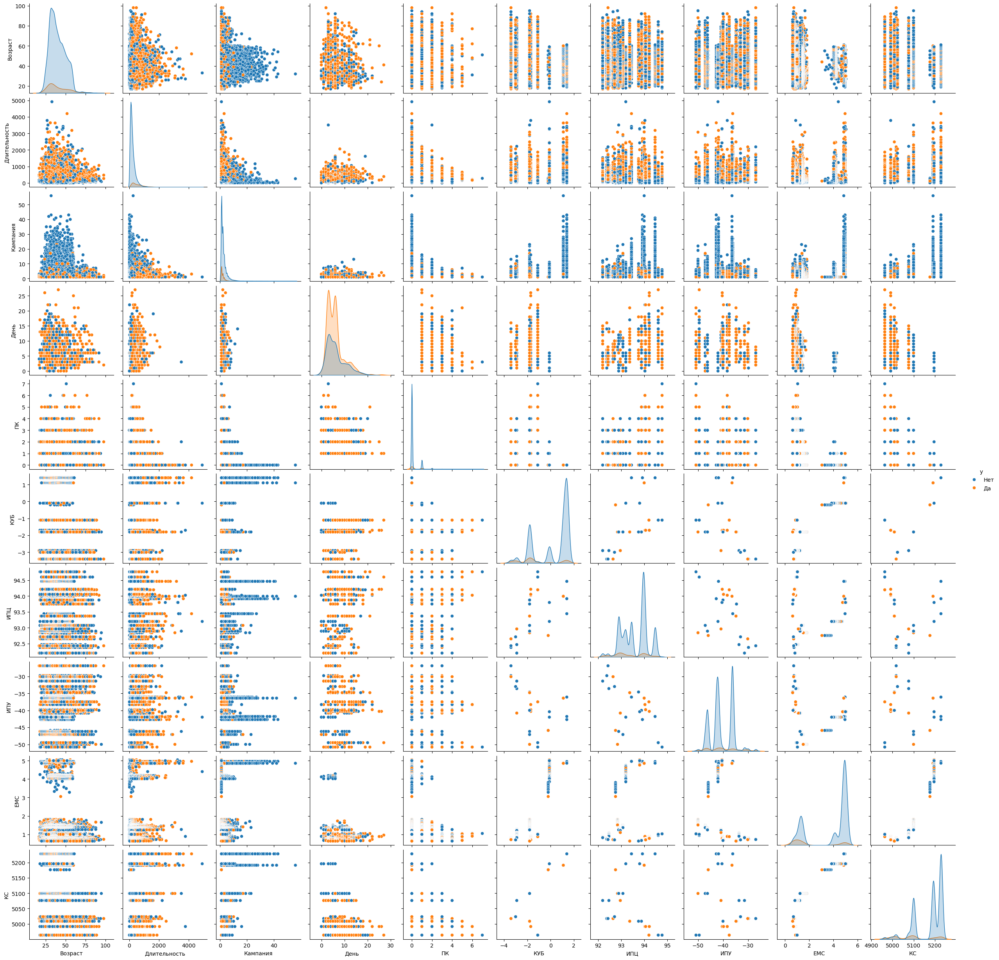

In [10]:
df.rename(columns = {
  'Предыдущий контакт': 'ПК',
  'Колебание уровня безработицы': 'КУБ',
  'Индекс потребительских цен': 'ИПЦ',
  'Индекс потребительской уверенности': 'ИПУ',
  'Европейская межбанковская ставка': 'ЕМС',
  'Количество сотрудников в компании': 'КС'}, inplace = True)


sns.pairplot(df, hue = 'y')

## Стандартизация

In [11]:
categoricalColumns = ['Работа', 'Семейный статус', 'Образование', 'Контакт', 'Месяц', 'День недели', 'Доходность', 'y']
df[categoricalColumns] = df[categoricalColumns].astype('category')
df[categoricalColumns] = df[categoricalColumns].apply(lambda x: x.cat.codes)

In [12]:
booleanColumns = ['Кредитный дефолт', 'Ипотека', 'Займ']
df[booleanColumns] = df[booleanColumns].astype('category')
df[booleanColumns] = df[booleanColumns].apply(lambda x: x.cat.codes)

In [15]:
features = ['КУБ', 'ИПЦ', 'ИПУ', 'ЕМС']
x = df.loc[:, features].values

In [16]:
x = StandardScaler().fit_transform(x)
pd.DataFrame(data = x, columns = features).head()

,КУБ,ИПЦ,ИПУ,ЕМС
0,-0.115781,0.38411,0.022169,0.820853
1,-0.115781,0.38411,0.022169,0.820853
2,-0.115781,0.38411,0.022169,0.820853
3,-0.115781,0.38411,0.022169,0.820853
4,-0.115781,0.38411,0.022169,0.820853


## Нормализация

In [18]:
dfToNormalize = pd.read_csv('https://www.dropbox.com/s/62xm9ymoaunnfg6/bank-full.csv?dl=1', sep=';')
features = ['Колебание уровня безработицы', 'Индекс потребительских цен', 'Индекс потребительской уверенности', 'Европейская межбанковская ставка']
x = dfToNormalize.loc[:, features].values

minMaxScaler = preprocessing.MinMaxScaler()
xScaled = minMaxScaler.fit_transform(x)
dfNormalized = pd.DataFrame(xScaled)

In [19]:
dfNormalized.head()

,0,1,2,3
0,0.6875,0.622369,0.435146,1.0
1,0.6875,0.622369,0.435146,1.0
2,0.6875,0.622369,0.435146,1.0
3,0.6875,0.622369,0.435146,1.0
4,0.6875,0.622369,0.435146,1.0


## Пересемплирование

In [20]:
X = df.loc[:, df.columns != 'y']
y = df.iloc[:, -1]

In [21]:
counter = Counter(y)
print(counter)

Counter({1: 36548, 0: 4640})


In [22]:
booleanColumns = ['Кредитный дефолт', 'Ипотека', 'Займ', 'y']
df[booleanColumns] = df[booleanColumns].astype('category')
df[booleanColumns] = df[booleanColumns].apply(lambda x: x.cat.codes)

In [27]:
print("Пропущенные значения по столбцам:")
print(X.isnull().sum())

Пропущенные значения по столбцам:
Возраст                 0
Работа                  0
Семейный статус         0
Образование             0
Кредитный дефолт        0
Ипотека                 0
Займ                    0
Контакт                 0
Месяц                   0
День недели             0
Длительность            0
Кампания                0
День                39673
ПК                      0
Доходность              0
КУБ                     0
ИПЦ                     0
ИПУ                     0
ЕМС                     0
КС                      0
dtype: int64


In [29]:
!pip install seaborn

<Axes: >

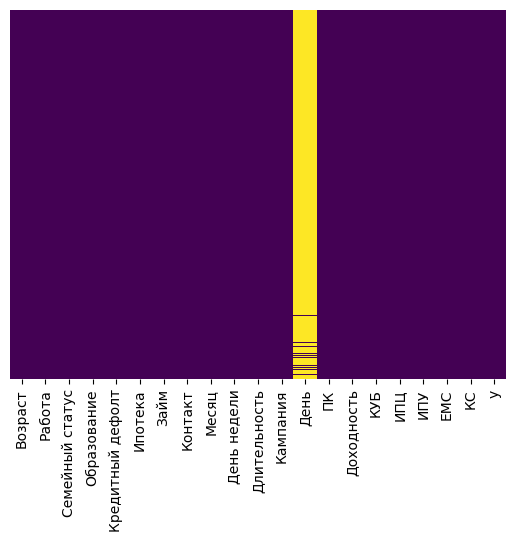

In [45]:
import seaborn as sns
sns.heatmap(df.isnull(), cbar=False, yticklabels=False, cmap = 'viridis')

In [42]:
# Создаем импутер (стратегия 'mean' - заполнение средним значением)
imputer = SimpleImputer(strategy='mean')
# Обучаем импутер на данных и сразу преобразуем их
X = imputer.fit_transform(X)

#oversample = SMOTE()
#X_resampled, y_resampled = oversample.fit_resample(X_filled, y)

In [43]:
oversample = SMOTE()
X, y = oversample.fit_resample(X, y)

In [44]:
counter = Counter(y)
print(counter)

Counter({1: 36548, 0: 36548})


In [48]:
df.head(5)

,Возраст,Работа,Семейный статус,Образование,Кредитный дефолт,Ипотека,Займ,Контакт,Месяц,День недели,...,Кампания,День,ПК,Доходность,КУБ,ИПЦ,ИПУ,ЕМС,КС,y
0,27,7,1,6,2,2,2,0,8,4,...,1,NaN,0,1,-0.1,93.798,-40.4,5.045,5195.8,1
1,30,6,0,6,2,2,2,0,8,4,...,1,NaN,0,1,-0.1,93.798,-40.4,5.045,5195.8,0
2,39,1,0,2,2,2,2,0,8,4,...,1,NaN,0,1,-0.1,93.798,-40.4,5.045,5195.8,0
3,42,3,0,3,2,0,0,0,8,4,...,1,NaN,0,1,-0.1,93.798,-40.4,5.045,5195.8,0
4,42,7,0,0,2,2,2,0,8,4,...,1,NaN,0,1,-0.1,93.798,-40.4,5.045,5195.8,0


# Моделирование

## Дерево решений

In [ ]:
X = df[df.columns[:-1]]
y = df['y']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=25, shuffle=True)

In [ ]:
tr = tree.DecisionTreeClassifier(max_depth=3, random_state=25)
tr.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3, random_state=25)

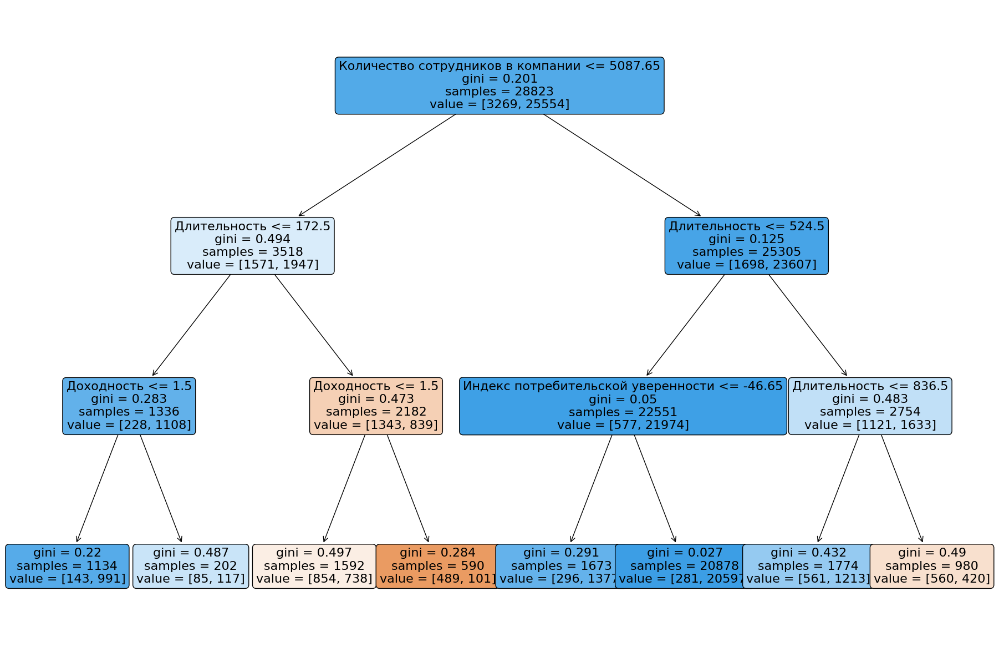

In [ ]:
fig = plt.figure(figsize=(23,15))
tree.plot_tree(tr.fit(X_train, y_train), feature_names=X.columns, filled=True, rounded=True, fontsize=16)

In [ ]:
tr_pred = tr.predict(X_test)
cv_tr = cross_val_score(tr, X_train, y_train, cv=10).mean()

In [ ]:
print('Доля правильных ответов: %.3f' % tr.score(X_test, y_test))
print('Доля правильных ответов во время кросс-валидации: %0.3f' % cv_tr)
print('Точность результата измерений: %.3f' % precision_score(y_test, tr_pred))
print('Полнота: %.3f' % recall_score(y_test, tr_pred))
print('Оценка F1: %.3f' % f1_score(y_test, tr_pred))

Доля правильных ответов: 0.910
Доля правильных ответов во время кросс-валидации: 0.908
Точность результата измерений: 0.946
Полнота: 0.953
Оценка F1: 0.950


In [ ]:
tr_probs = tr.predict_proba(X_test)
tr_probs = tr_probs[:, 1]
auc_tr = roc_auc_score(y_test, tr_probs)
print('AUC: %.2f' % auc_tr)

AUC: 0.90


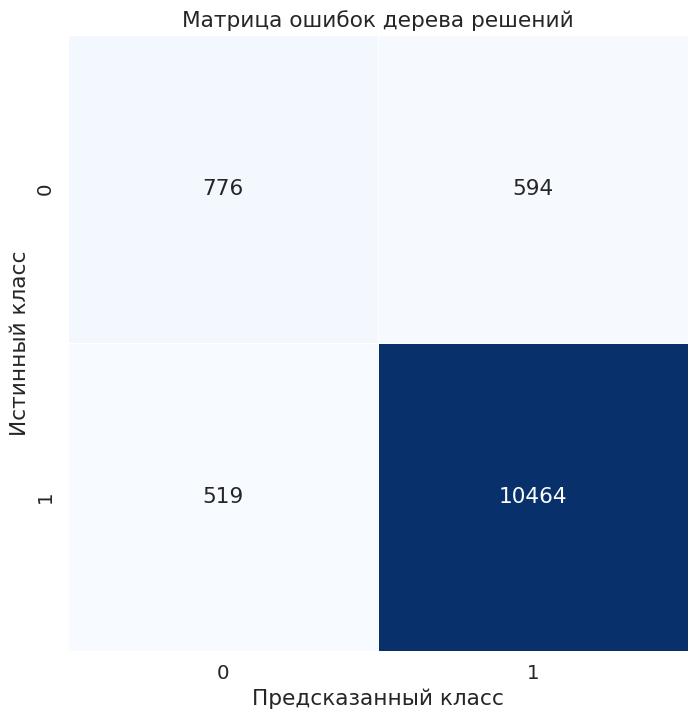

In [ ]:
tr_matrix = confusion_matrix(y_test,tr_pred)
sns.set(font_scale=1.3)
plt.subplots(figsize=(8,8))
sns.heatmap(tr_matrix, annot=True, cbar=False, cmap='Blues', linewidth=0.5, fmt="d")
plt.ylabel('Истинный класс')
plt.xlabel('Предсказанный класс')
plt.title('Матрица ошибок дерева решений');

### Регуляризация

In [ ]:
parameters = {'criterion':['gini','entropy'],
              'max_depth':[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
             }

default_tr = tree.DecisionTreeClassifier(random_state=25)
gs_tree = GridSearchCV(default_tr, parameters, cv=10, n_jobs=-1,verbose=1)
gs_tree.fit(X_train, y_train)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=25),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                       13, 14, 15, 16, 17, 18, 19, 20]},
             verbose=1)

In [ ]:
gs_tree_pred = gs_tree.predict(X_test)

In [ ]:
print('Лучшие параметры дерева решений: {}'.format(gs_tree.best_params_))
print('Доля правильных ответов: %0.3f' % (gs_tree.score(X_test,y_test)))
print('Доля правильных ответов кросс-валидации: %0.3f' % gs_tree.best_score_)
print('Точность: %.3f' % precision_score(y_test, gs_tree_pred))
print('Полнота: %.3f' % recall_score(y_test, gs_tree_pred))
print('F1-мера: %.3f' % f1_score(y_test, gs_tree_pred))

Лучшие параметры дерева решений: {'criterion': 'gini', 'max_depth': 5}
Доля правильных ответов: 0.915
Доля правильных ответов кросс-валидации: 0.913
Точность: 0.936
Полнота: 0.970
F1-мера: 0.953


In [ ]:
gs_tree_probs = gs_tree.predict_proba(X_test)
gs_tree_probs = gs_tree_probs[:, 1]
gs_tree_auc = roc_auc_score(y_test, gs_tree_probs)
print('AUC: %.2f' % gs_tree_auc)

AUC: 0.93


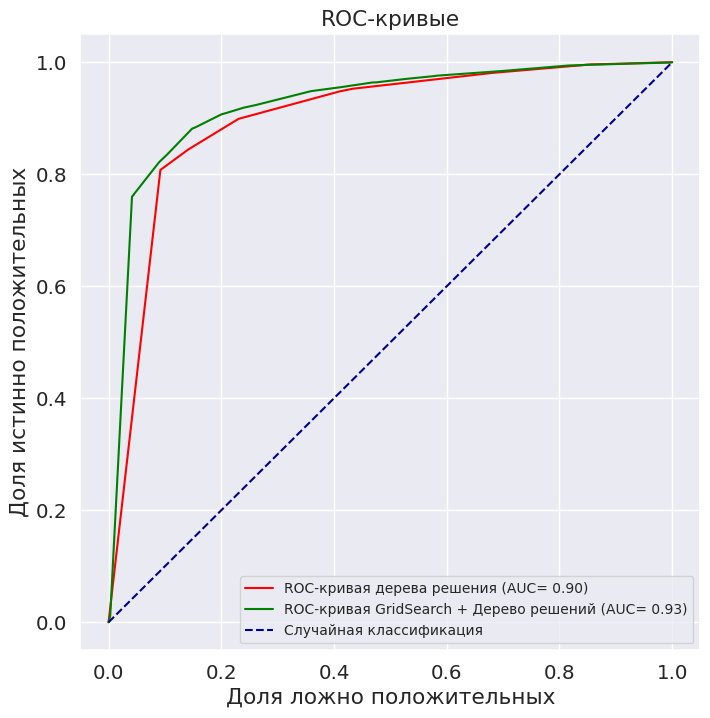

In [ ]:
gs_tr_fpr, gs_tr_tpr, gs_tr_thresholds = roc_curve(y_test, gs_tree_probs)
tr_fpr, tr_tpr, tr_thresholds = roc_curve(y_test, tr_probs)

plt.figure(figsize=(8,8))
plt.plot(tr_fpr, tr_tpr, color='red', label='ROC-кривая дерева решения (AUC= %0.2f)'% auc_tr)
plt.plot(gs_tr_fpr, gs_tr_tpr, color='green', label='ROC-кривая GridSearch + Дерево решений (AUC= %0.2f)'% gs_tree_auc)
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--', label='Случайная классификация')
plt.xlabel('Доля ложно положительных')
plt.ylabel('Доля истинно положительных')
plt.title('ROC-кривые')
plt.legend(loc='lower right', prop={'size': 10})
plt.show()

## Глубокое обучение (многослойный перцептрон)

In [ ]:
mlp = MLPClassifier(hidden_layer_sizes=(100), max_iter=1000, random_state=25, shuffle=True)
mlp.fit(X_train, y_train)

MLPClassifier(hidden_layer_sizes=100, max_iter=1000, random_state=25)

In [ ]:
mlp_pred = mlp.predict(X_test)
cv_mlp=cross_val_score(mlp, X_train, y_train, cv=10).mean()

In [ ]:
print('Доля правильных ответов: %.3f' % mlp.score(X_test, y_test))
print('Доля правильных ответов во время кросс-валидации: %0.3f' % cv_mlp)
print('Точность результата измерений: %.3f' % precision_score(y_test, mlp_pred))
print('Полнота: %.3f' % recall_score(y_test, mlp_pred))
print('Оценка F1: %.3f' % f1_score(y_test, mlp_pred))

Доля правильных ответов: 0.889
Доля правильных ответов во время кросс-валидации: 0.888
Точность результата измерений: 0.889
Полнота: 1.000
Оценка F1: 0.941


In [ ]:
mlp_probs = mlp.predict_proba(X_test)
mlp_probs = mlp_probs[:, 1]

auc_mlp = roc_auc_score(y_test, mlp_probs)
print('AUC: %.2f' % auc_mlp)

AUC: 0.91


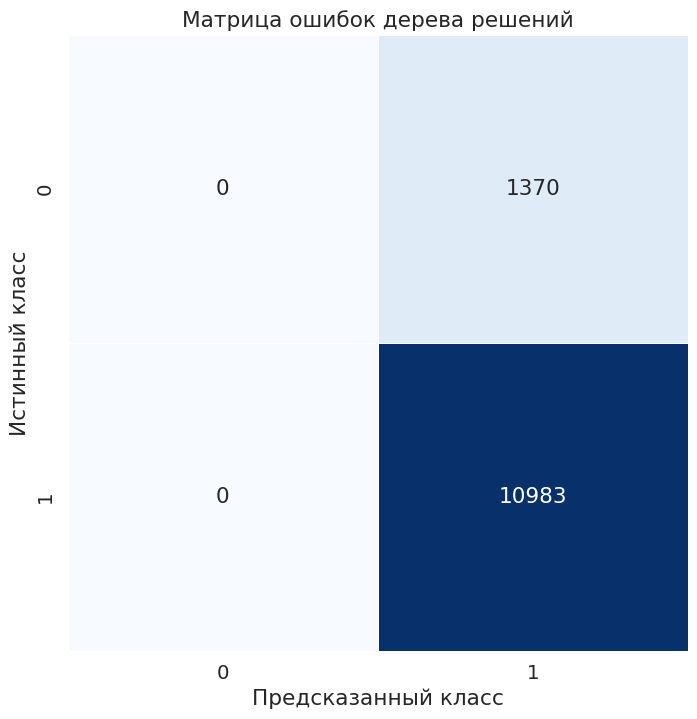

In [ ]:
matrix = confusion_matrix(y_test, mlp_pred)
sns.set(font_scale=1.3)
plt.subplots(figsize=(8, 8))
sns.heatmap(matrix, annot=True, cbar=False, cmap='Blues', linewidth=0.5, fmt="d")
plt.ylabel('Истинный класс')
plt.xlabel('Предсказанный класс')
plt.title('Матрица ошибок дерева решений')

In [ ]:
parameters = {'activation':['logistic','relu'],'solver': ['lbfgs','adam','sgd'],
              'alpha':10.0 ** -np.arange(1,4),
              'hidden_layer_sizes':[(20),(4),(10),(14,2),(4,1),(10,5),(11,3)]}

default_mlp = MLPClassifier(random_state=25)
gs_mlp = GridSearchCV(default_mlp, parameters, cv=10, n_jobs=-1, verbose=1)
gs_mlp.fit(X_train, y_train)

Fitting 10 folds for each of 126 candidates, totalling 1260 fits


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


GridSearchCV(cv=10, estimator=MLPClassifier(random_state=25), n_jobs=-1,
             param_grid={'activation': ['logistic', 'relu'],
                         'alpha': array([0.1  , 0.01 , 0.001]),
                         'hidden_layer_sizes': [20, 4, 10, (14, 2), (4, 1),
                                                (10, 5), (11, 3)],
                         'solver': ['lbfgs', 'adam', 'sgd']},
             verbose=1)

In [ ]:
gs_mlp_pred = gs_mlp.predict(X_test)

In [ ]:
print("Лучшие параметры MLP: {}".format(gs_mlp.best_params_))
print('Доля правильных ответов во время кросс-валидации: %0.3f' % gs_mlp.best_score_)
print('Доля правильных ответов: %0.3f' % (gs_mlp.score(X_test,y_test)))
print('Точность результата измерений: %.3f' % precision_score(y_test, gs_mlp_pred))
print('Полнота: %.3f' % recall_score(y_test, gs_mlp_pred))
print('Оценка F1: %.3f' % f1_score(y_test, gs_mlp_pred))

Лучшие параметры MLP: {'activation': 'logistic', 'alpha': 0.001, 'hidden_layer_sizes': 10, 'solver': 'lbfgs'}
Доля правильных ответов во время кросс-валидации: 0.906
Доля правильных ответов: 0.904
Точность результата измерений: 0.947
Полнота: 0.945
Оценка F1: 0.946


In [ ]:
gs_mlp_probs = gs_mlp.predict_proba(X_test)
gs_mlp_probs = gs_mlp_probs[:, 1]

gs_mlp_auc = roc_auc_score(y_test, gs_mlp_probs)
print('AUC: %.2f' % gs_mlp_auc)

AUC: 0.92


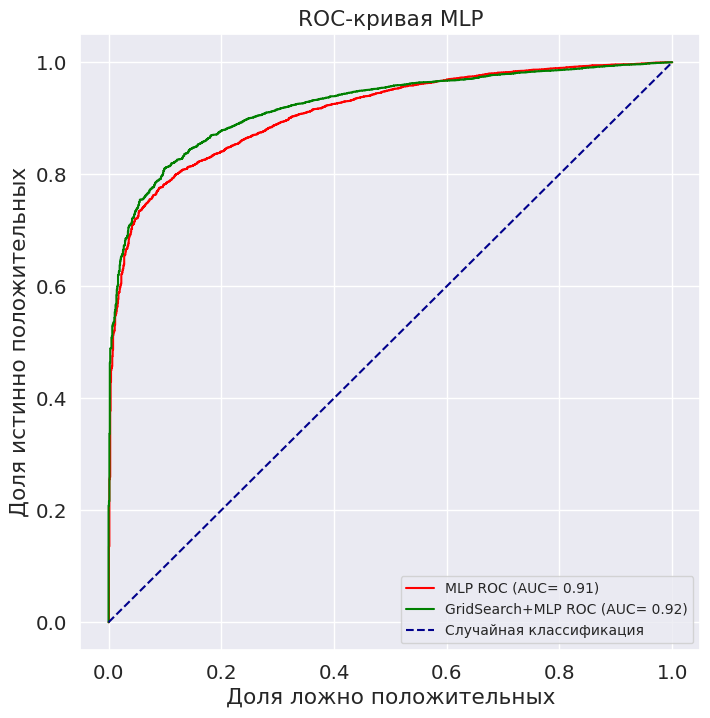

In [ ]:
gs_mlp_fpr, gs_mlp_tpr, gs_mlp_thresholds = roc_curve(y_test, gs_mlp_probs)
mlp_fpr, mlp_tpr, mlp_thresholds = roc_curve(y_test, mlp_probs)

plt.figure(figsize=(8,8))
plt.plot(mlp_fpr, mlp_tpr, color='red', label='MLP ROC (AUC= %0.2f)'% auc_mlp)
plt.plot(gs_mlp_fpr, gs_mlp_tpr, color='green', label='GridSearch+MLP ROC (AUC= %0.2f)'% gs_mlp_auc)
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--', label='Случайная классификация')
plt.xlabel('Доля ложно положительных')
plt.ylabel('Доля истинно положительных')
plt.title('ROC-кривая MLP')
plt.legend(loc='lower right', prop={'size': 10})
plt.show()

In [ ]:
metrics=['Accuracy','CV accuracy','Precision','Recall','F1','ROC AUC']

fig = go.Figure(data=[
    go.Bar(name='GridSearchCV + Дерево решений',x=metrics,
           y=[gs_tree.score(X_test,y_test), gs_tree.best_score_, precision_score(y_test, gs_tree_pred), recall_score(y_test, gs_tree_pred), f1_score(y_test, gs_tree_pred), gs_tree_auc]),
    go.Bar(name='GridSearchCV + Нейронная сеть', x=metrics,
           y=[gs_mlp.score(X_test,y_test), gs_mlp.best_score_, precision_score(y_test, gs_mlp_pred), recall_score(y_test, gs_mlp_pred), f1_score(y_test, gs_mlp_pred), gs_mlp_auc])
    ])

fig.update_layout(title_text='Метрики обеих моделей', barmode='group', xaxis_tickangle=-45, bargroupgap=0.05)
fig.show()